# 🤪 Conditional WGAN-GP on CelebA Faces - Train

In this notebook, we'll walk through the steps required to train your own Conditional GAN on the CelebA faces dataset

The code has been adapted from the excellent [CGAN tutorial](https://keras.io/examples/generative/conditional_gan/) created by Sayak Paul, available on the Keras website.

In [1]:
%load_ext autoreload
%autoreload 2
import numpy as np
import pandas as pd

import tensorflow as tf
from tensorflow.keras import (
    layers,
    models,
    callbacks,
    utils,
    metrics,
    optimizers,
)

from notebooks.utils import display, sample_batch

## 0. Parameters <a name="parameters"></a>

In [2]:
IMAGE_SIZE = 64
CHANNELS = 3
CLASSES = 2
BATCH_SIZE = 512
Z_DIM = 32
LEARNING_RATE = 0.00005
ADAM_BETA_1 = 0.5
ADAM_BETA_2 = 0.999
EPOCHS = 20
CRITIC_STEPS = 3
GP_WEIGHT = 10.0
LOAD_MODEL = False
ADAM_BETA_1 = 0.5
ADAM_BETA_2 = 0.9
LABEL = "Blond_Hair"

## 1. Prepare the data <a name="prepare"></a>

In [3]:
# Load the label dataset
# attributes = pd.read_csv("/app/data/celeba-dataset/list_attr_celeba.csv")
# print(attributes.columns)
# attributes.head()
attributes = {}
with open("..\\..\\..\\data\\img_align_celeba\\list_attr_celeba.txt", 'r') as f:
    num_samples = next(f)
    print(num_samples)
    columns = next(f).split()
    for column in columns:
        attributes[column] = []
    for line in f:
        row = line.split()[1:]
        if len(row) == len(attributes.keys()):
            for i, el in enumerate(row):
                
                attributes[columns[i]].append(int(el))

202599



In [4]:
# Load the data
labels = attributes[LABEL]
int_labels = [x if x == 1 else 0 for x in labels]
int_labels[:20]

[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0]

In [5]:
train_data = utils.image_dataset_from_directory(
    "..\\..\\..\\data\\img_align_celeba",
    labels=int_labels,
    color_mode="rgb",
    image_size=(IMAGE_SIZE, IMAGE_SIZE),
    batch_size=BATCH_SIZE,
    shuffle=True,
    seed=42,
    interpolation="bilinear",
)

Found 202599 files belonging to 1 classes.


In [6]:
# Preprocess the data
def preprocess(img):
    """
    Normalize and reshape the images
    """
    img = (tf.cast(img, "float32") - 127.5) / 127.5
    return img


train = train_data.map(
    lambda x, y: (preprocess(x), tf.one_hot(y, depth=CLASSES))
)

In [7]:
# Show some faces from the training set
train_sample = sample_batch(train)

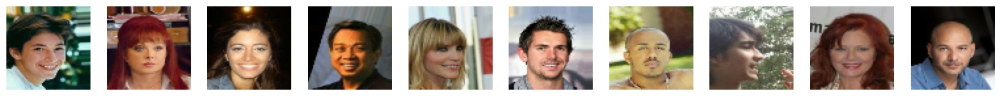

In [8]:
display(train_sample, cmap=None)

In [9]:
train_sample.shape

(512, 64, 64, 3)

## 2. Build the GAN <a name="build"></a>

In [10]:
critic_input = layers.Input(shape=(IMAGE_SIZE, IMAGE_SIZE, CHANNELS))
label_input = layers.Input(shape=(IMAGE_SIZE, IMAGE_SIZE, CLASSES))
x = layers.Concatenate(axis=-1)([critic_input, label_input])
x = layers.Conv2D(64, kernel_size=4, strides=2, padding="same")(x)
x = layers.LeakyReLU(0.2)(x)
x = layers.Conv2D(128, kernel_size=4, strides=2, padding="same")(x)
x = layers.LeakyReLU()(x)
x = layers.Dropout(0.3)(x)
x = layers.Conv2D(128, kernel_size=4, strides=2, padding="same")(x)
x = layers.LeakyReLU(0.2)(x)
x = layers.Dropout(0.3)(x)
x = layers.Conv2D(128, kernel_size=4, strides=2, padding="same")(x)
x = layers.LeakyReLU(0.2)(x)
x = layers.Dropout(0.3)(x)
x = layers.Conv2D(1, kernel_size=4, strides=1, padding="valid")(x)
critic_output = layers.Flatten()(x)

critic = models.Model([critic_input, label_input], critic_output)
critic.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 64, 64, 3)]  0           []                               
                                                                                                  
 input_2 (InputLayer)           [(None, 64, 64, 2)]  0           []                               
                                                                                                  
 concatenate (Concatenate)      (None, 64, 64, 5)    0           ['input_1[0][0]',                
                                                                  'input_2[0][0]']                
                                                                                                  
 conv2d (Conv2D)                (None, 32, 32, 64)   5184        ['concatenate[0][0]']        

In [11]:
generator_input = layers.Input(shape=(Z_DIM,))
label_input = layers.Input(shape=(CLASSES,))
x = layers.Concatenate(axis=-1)([generator_input, label_input])
x = layers.Reshape((1, 1, Z_DIM + CLASSES))(x)
x = layers.Conv2DTranspose(
    128, kernel_size=4, strides=1, padding="valid", use_bias=False
)(x)
x = layers.BatchNormalization(momentum=0.9)(x)
x = layers.LeakyReLU(0.2)(x)
x = layers.Conv2DTranspose(
    128, kernel_size=4, strides=2, padding="same", use_bias=False
)(x)
x = layers.BatchNormalization(momentum=0.9)(x)
x = layers.LeakyReLU(0.2)(x)
x = layers.Conv2DTranspose(
    128, kernel_size=4, strides=2, padding="same", use_bias=False
)(x)
x = layers.BatchNormalization(momentum=0.9)(x)
x = layers.LeakyReLU(0.2)(x)
x = layers.Conv2DTranspose(
    64, kernel_size=4, strides=2, padding="same", use_bias=False
)(x)
x = layers.BatchNormalization(momentum=0.9)(x)
x = layers.LeakyReLU(0.2)(x)
generator_output = layers.Conv2DTranspose(
    CHANNELS, kernel_size=4, strides=2, padding="same", activation="tanh"
)(x)
generator = models.Model([generator_input, label_input], generator_output)
generator.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 32)]         0           []                               
                                                                                                  
 input_4 (InputLayer)           [(None, 2)]          0           []                               
                                                                                                  
 concatenate_1 (Concatenate)    (None, 34)           0           ['input_3[0][0]',                
                                                                  'input_4[0][0]']                
                                                                                                  
 reshape (Reshape)              (None, 1, 1, 34)     0           ['concatenate_1[0][0]']    

In [12]:
class ConditionalWGAN(models.Model):
    def __init__(self, critic, generator, latent_dim, critic_steps, gp_weight):
        super(ConditionalWGAN, self).__init__()
        self.critic = critic
        self.generator = generator
        self.latent_dim = latent_dim
        self.critic_steps = critic_steps
        self.gp_weight = gp_weight

    def compile(self, c_optimizer, g_optimizer):
        super(ConditionalWGAN, self).compile(run_eagerly=True)
        self.c_optimizer = c_optimizer
        self.g_optimizer = g_optimizer
        self.c_wass_loss_metric = metrics.Mean(name="c_wass_loss")
        self.c_gp_metric = metrics.Mean(name="c_gp")
        self.c_loss_metric = metrics.Mean(name="c_loss")
        self.g_loss_metric = metrics.Mean(name="g_loss")

    @property
    def metrics(self):
        return [
            self.c_loss_metric,
            self.c_wass_loss_metric,
            self.c_gp_metric,
            self.g_loss_metric,
        ]

    def gradient_penalty(
        self, batch_size, real_images, fake_images, image_one_hot_labels
    ):
        alpha = tf.random.normal([batch_size, 1, 1, 1], 0.0, 1.0)
        diff = fake_images - real_images
        interpolated = real_images + alpha * diff

        with tf.GradientTape() as gp_tape:
            gp_tape.watch(interpolated)
            pred = self.critic(
                [interpolated, image_one_hot_labels], training=True
            )

        grads = gp_tape.gradient(pred, [interpolated])[0]
        norm = tf.sqrt(tf.reduce_sum(tf.square(grads), axis=[1, 2, 3]))
        gp = tf.reduce_mean((norm - 1.0) ** 2)
        return gp

    def train_step(self, data):
        real_images, one_hot_labels = data

        image_one_hot_labels = one_hot_labels[:, None, None, :]
        image_one_hot_labels = tf.repeat(
            image_one_hot_labels, repeats=IMAGE_SIZE, axis=1
        )
        image_one_hot_labels = tf.repeat(
            image_one_hot_labels, repeats=IMAGE_SIZE, axis=2
        )

        batch_size = tf.shape(real_images)[0]

        for i in range(self.critic_steps):
            random_latent_vectors = tf.random.normal(
                shape=(batch_size, self.latent_dim)
            )

            with tf.GradientTape() as tape:
                fake_images = self.generator(
                    [random_latent_vectors, one_hot_labels], training=True
                )

                fake_predictions = self.critic(
                    [fake_images, image_one_hot_labels], training=True
                )
                real_predictions = self.critic(
                    [real_images, image_one_hot_labels], training=True
                )

                c_wass_loss = tf.reduce_mean(fake_predictions) - tf.reduce_mean(
                    real_predictions
                )
                c_gp = self.gradient_penalty(
                    batch_size, real_images, fake_images, image_one_hot_labels
                )
                c_loss = c_wass_loss + c_gp * self.gp_weight

            c_gradient = tape.gradient(c_loss, self.critic.trainable_variables)
            self.c_optimizer.apply_gradients(
                zip(c_gradient, self.critic.trainable_variables)
            )

        random_latent_vectors = tf.random.normal(
            shape=(batch_size, self.latent_dim)
        )

        with tf.GradientTape() as tape:
            fake_images = self.generator(
                [random_latent_vectors, one_hot_labels], training=True
            )
            fake_predictions = self.critic(
                [fake_images, image_one_hot_labels], training=True
            )
            g_loss = -tf.reduce_mean(fake_predictions)

        gen_gradient = tape.gradient(g_loss, self.generator.trainable_variables)
        self.g_optimizer.apply_gradients(
            zip(gen_gradient, self.generator.trainable_variables)
        )

        self.c_loss_metric.update_state(c_loss)
        self.c_wass_loss_metric.update_state(c_wass_loss)
        self.c_gp_metric.update_state(c_gp)
        self.g_loss_metric.update_state(g_loss)

        return {m.name: m.result() for m in self.metrics}

In [13]:
# Create a GAN
cgan = ConditionalWGAN(
    critic=critic,
    generator=generator,
    latent_dim=Z_DIM,
    critic_steps=CRITIC_STEPS,
    gp_weight=GP_WEIGHT,
)

In [14]:
if LOAD_MODEL:
    cgan.load_weights("./checkpoint/checkpoint.ckpt")

## 3. Train the GAN <a name="train"></a>

In [15]:
# Compile the GAN
cgan.compile(
    c_optimizer=optimizers.Adam(
        learning_rate=LEARNING_RATE, beta_1=ADAM_BETA_1, beta_2=ADAM_BETA_2
    ),
    g_optimizer=optimizers.Adam(
        learning_rate=LEARNING_RATE, beta_1=ADAM_BETA_1, beta_2=ADAM_BETA_2
    ),
)

In [16]:
# Create a model save checkpoint
model_checkpoint_callback = callbacks.ModelCheckpoint(
    filepath="./checkpoint/checkpoint.ckpt",
    save_weights_only=True,
    save_freq="epoch",
    verbose=0,
)

tensorboard_callback = callbacks.TensorBoard(log_dir="./logs")


class ImageGenerator(callbacks.Callback):
    def __init__(self, num_img, latent_dim):
        self.num_img = num_img
        self.latent_dim = latent_dim

    def on_epoch_end(self, epoch, logs=None):
        random_latent_vectors = tf.random.normal(
            shape=(self.num_img, self.latent_dim)
        )
        # 0 label
        zero_label = np.repeat([[1, 0]], self.num_img, axis=0)
        generated_images = self.model.generator(
            [random_latent_vectors, zero_label]
        )
        generated_images = generated_images * 127.5 + 127.5
        generated_images = generated_images.numpy()
        display(
            generated_images,
            save_to="./output/generated_img_%03d_label_0.png" % (epoch),
            cmap=None,
        )

        # 1 label
        one_label = np.repeat([[0, 1]], self.num_img, axis=0)
        generated_images = self.model.generator(
            [random_latent_vectors, one_label]
        )
        generated_images = generated_images * 127.5 + 127.5
        generated_images = generated_images.numpy()
        display(
            generated_images,
            save_to="./output/generated_img_%03d_label_1.png" % (epoch),
            cmap=None,
        )

Epoch 1/20
396/396 [==============================] - ETA: 0s - c_loss: -31.7233 - c_wass_loss: -44.2913 - c_gp: 1.2568 - g_loss: 199.0806
Saved to ./output/generated_img_000_label_0.png


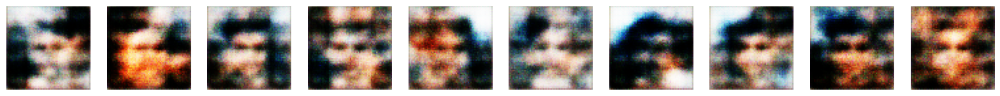


Saved to ./output/generated_img_000_label_1.png


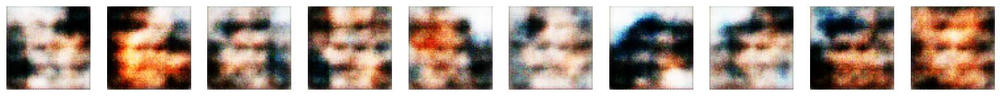

396/396 [==============================] - 139s 336ms/step - c_loss: -31.7233 - c_wass_loss: -44.2913 - c_gp: 1.2568 - g_loss: 199.0806
Epoch 2/20
396/396 [==============================] - ETA: 0s - c_loss: -7.2830 - c_wass_loss: -8.2997 - c_gp: 0.1017 - g_loss: 141.7899
Saved to ./output/generated_img_001_label_0.png


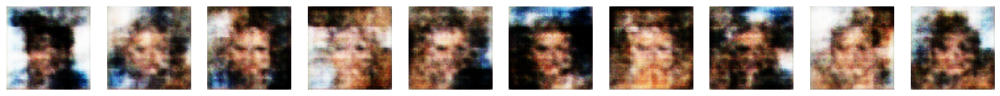


Saved to ./output/generated_img_001_label_1.png


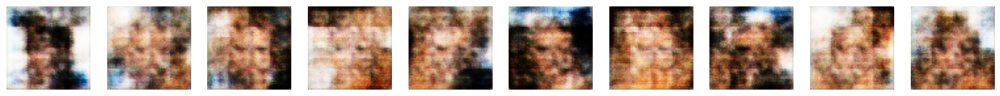

396/396 [==============================] - 107s 269ms/step - c_loss: -7.2830 - c_wass_loss: -8.2997 - c_gp: 0.1017 - g_loss: 141.7899
Epoch 3/20
396/396 [==============================] - ETA: 0s - c_loss: -6.2808 - c_wass_loss: -7.0560 - c_gp: 0.0775 - g_loss: 64.4419
Saved to ./output/generated_img_002_label_0.png


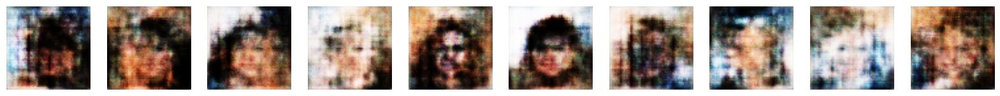


Saved to ./output/generated_img_002_label_1.png


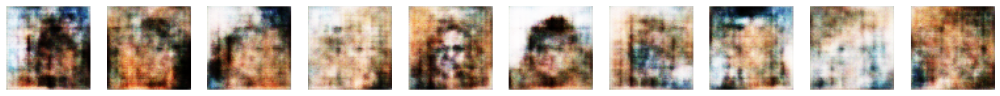

396/396 [==============================] - 110s 275ms/step - c_loss: -6.2808 - c_wass_loss: -7.0560 - c_gp: 0.0775 - g_loss: 64.4419
Epoch 4/20
396/396 [==============================] - ETA: 0s - c_loss: -5.7486 - c_wass_loss: -6.4066 - c_gp: 0.0658 - g_loss: 54.4560
Saved to ./output/generated_img_003_label_0.png


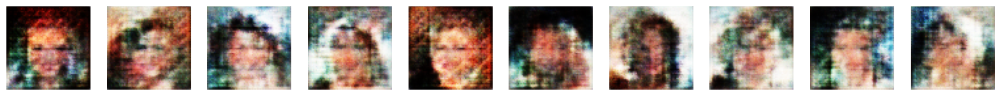


Saved to ./output/generated_img_003_label_1.png


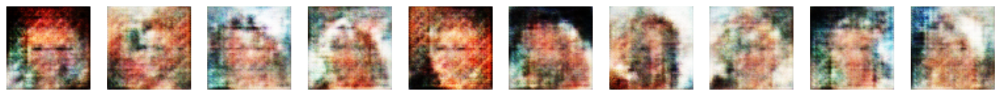

396/396 [==============================] - 109s 273ms/step - c_loss: -5.7486 - c_wass_loss: -6.4066 - c_gp: 0.0658 - g_loss: 54.4560
Epoch 5/20
396/396 [==============================] - ETA: 0s - c_loss: -5.5777 - c_wass_loss: -6.2084 - c_gp: 0.0631 - g_loss: 65.7820
Saved to ./output/generated_img_004_label_0.png


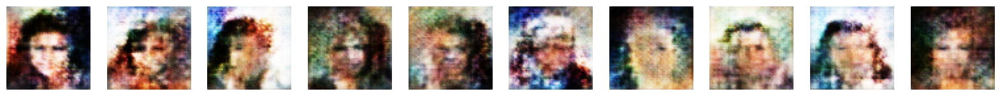


Saved to ./output/generated_img_004_label_1.png


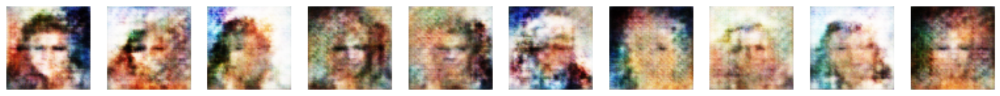

396/396 [==============================] - 109s 272ms/step - c_loss: -5.5777 - c_wass_loss: -6.2084 - c_gp: 0.0631 - g_loss: 65.7820
Epoch 6/20
396/396 [==============================] - ETA: 0s - c_loss: -4.8790 - c_wass_loss: -5.3804 - c_gp: 0.0501 - g_loss: 58.6721
Saved to ./output/generated_img_005_label_0.png


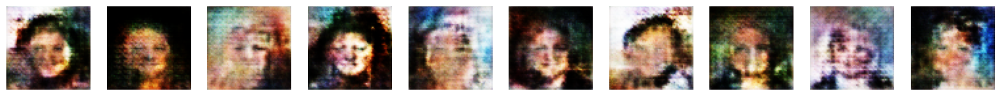


Saved to ./output/generated_img_005_label_1.png


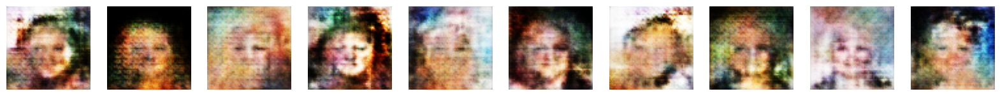

396/396 [==============================] - 109s 273ms/step - c_loss: -4.8790 - c_wass_loss: -5.3804 - c_gp: 0.0501 - g_loss: 58.6721
Epoch 7/20
396/396 [==============================] - ETA: 0s - c_loss: -4.3104 - c_wass_loss: -4.7257 - c_gp: 0.0415 - g_loss: 34.7113
Saved to ./output/generated_img_006_label_0.png


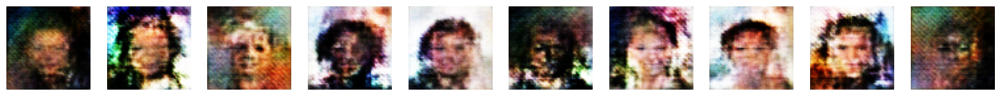


Saved to ./output/generated_img_006_label_1.png


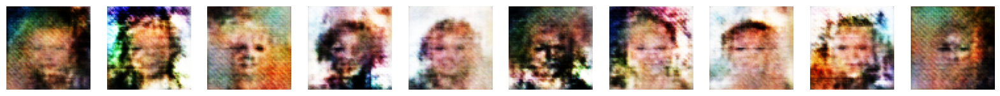

396/396 [==============================] - 105s 263ms/step - c_loss: -4.3104 - c_wass_loss: -4.7257 - c_gp: 0.0415 - g_loss: 34.7113
Epoch 8/20
396/396 [==============================] - ETA: 0s - c_loss: -4.1900 - c_wass_loss: -4.6009 - c_gp: 0.0411 - g_loss: 17.6891
Saved to ./output/generated_img_007_label_0.png


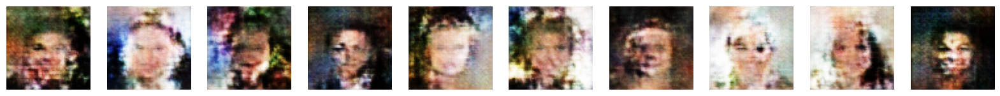


Saved to ./output/generated_img_007_label_1.png


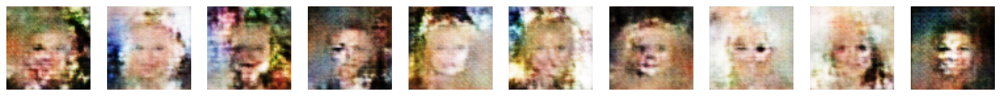

396/396 [==============================] - 109s 274ms/step - c_loss: -4.1900 - c_wass_loss: -4.6009 - c_gp: 0.0411 - g_loss: 17.6891
Epoch 9/20
396/396 [==============================] - ETA: 0s - c_loss: -4.1706 - c_wass_loss: -4.5552 - c_gp: 0.0385 - g_loss: 1.9824
Saved to ./output/generated_img_008_label_0.png


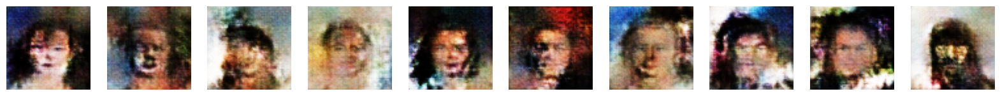


Saved to ./output/generated_img_008_label_1.png


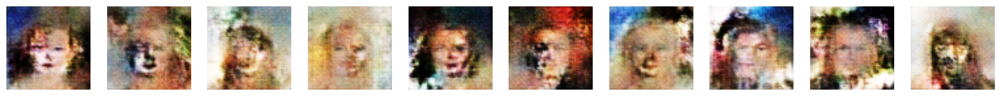

396/396 [==============================] - 116s 290ms/step - c_loss: -4.1706 - c_wass_loss: -4.5552 - c_gp: 0.0385 - g_loss: 1.9824
Epoch 10/20
396/396 [==============================] - ETA: 0s - c_loss: -3.8319 - c_wass_loss: -4.1860 - c_gp: 0.0354 - g_loss: 3.0983
Saved to ./output/generated_img_009_label_0.png


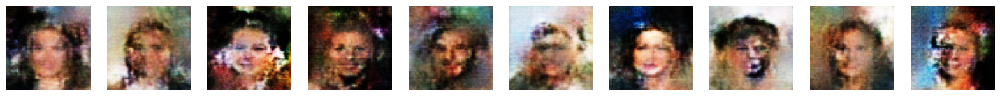


Saved to ./output/generated_img_009_label_1.png


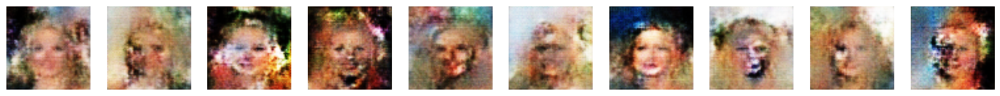

396/396 [==============================] - 117s 292ms/step - c_loss: -3.8319 - c_wass_loss: -4.1860 - c_gp: 0.0354 - g_loss: 3.0983
Epoch 11/20
396/396 [==============================] - ETA: 0s - c_loss: -3.7599 - c_wass_loss: -4.0782 - c_gp: 0.0318 - g_loss: 16.0572
Saved to ./output/generated_img_010_label_0.png


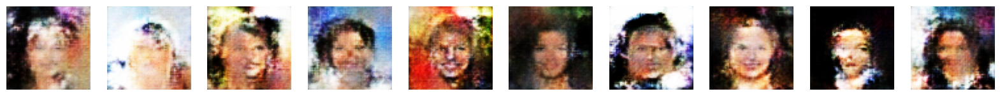


Saved to ./output/generated_img_010_label_1.png


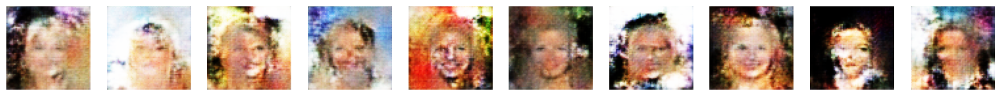

396/396 [==============================] - 118s 294ms/step - c_loss: -3.7599 - c_wass_loss: -4.0782 - c_gp: 0.0318 - g_loss: 16.0572
Epoch 12/20
396/396 [==============================] - ETA: 0s - c_loss: -3.2548 - c_wass_loss: -3.5281 - c_gp: 0.0273 - g_loss: 10.7666
Saved to ./output/generated_img_011_label_0.png


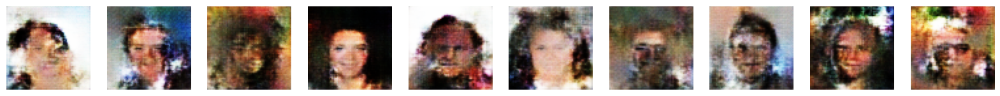


Saved to ./output/generated_img_011_label_1.png


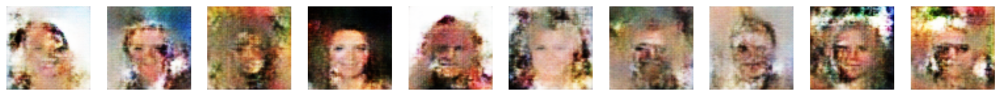

396/396 [==============================] - 119s 299ms/step - c_loss: -3.2548 - c_wass_loss: -3.5281 - c_gp: 0.0273 - g_loss: 10.7666
Epoch 13/20
396/396 [==============================] - ETA: 0s - c_loss: -3.3041 - c_wass_loss: -3.5642 - c_gp: 0.0260 - g_loss: 8.4376
Saved to ./output/generated_img_012_label_0.png


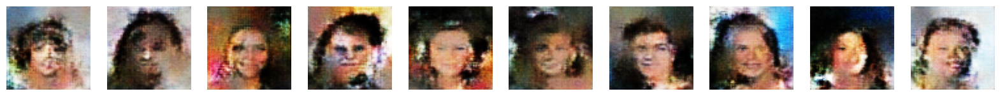


Saved to ./output/generated_img_012_label_1.png


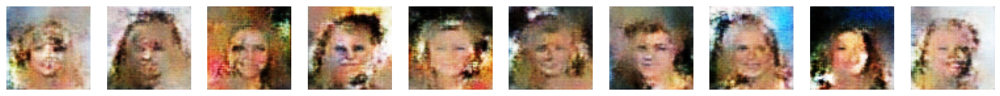

396/396 [==============================] - 118s 295ms/step - c_loss: -3.3041 - c_wass_loss: -3.5642 - c_gp: 0.0260 - g_loss: 8.4376
Epoch 14/20
396/396 [==============================] - ETA: 0s - c_loss: -3.1454 - c_wass_loss: -3.3870 - c_gp: 0.0242 - g_loss: 19.2152
Saved to ./output/generated_img_013_label_0.png


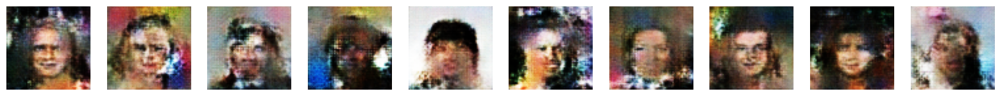


Saved to ./output/generated_img_013_label_1.png


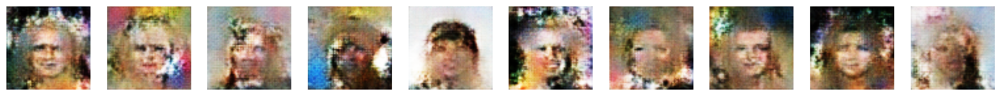

396/396 [==============================] - 118s 295ms/step - c_loss: -3.1454 - c_wass_loss: -3.3870 - c_gp: 0.0242 - g_loss: 19.2152
Epoch 15/20
396/396 [==============================] - ETA: 0s - c_loss: -3.0611 - c_wass_loss: -3.2927 - c_gp: 0.0232 - g_loss: 13.0630
Saved to ./output/generated_img_014_label_0.png


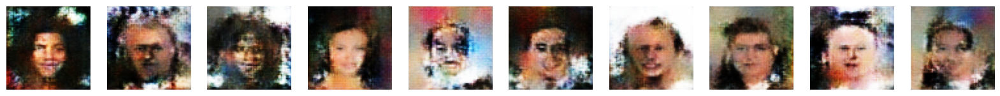


Saved to ./output/generated_img_014_label_1.png


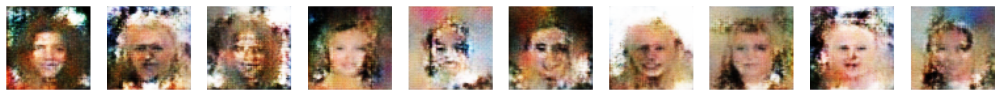

396/396 [==============================] - 117s 293ms/step - c_loss: -3.0611 - c_wass_loss: -3.2927 - c_gp: 0.0232 - g_loss: 13.0630
Epoch 16/20
396/396 [==============================] - ETA: 0s - c_loss: -2.9569 - c_wass_loss: -3.1767 - c_gp: 0.0220 - g_loss: 20.0524
Saved to ./output/generated_img_015_label_0.png


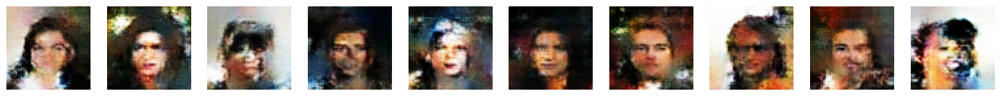


Saved to ./output/generated_img_015_label_1.png


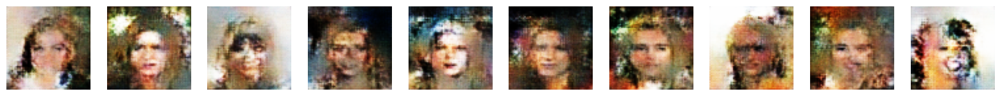

396/396 [==============================] - 118s 295ms/step - c_loss: -2.9569 - c_wass_loss: -3.1767 - c_gp: 0.0220 - g_loss: 20.0524
Epoch 17/20
396/396 [==============================] - ETA: 0s - c_loss: -2.8764 - c_wass_loss: -3.1002 - c_gp: 0.0224 - g_loss: 30.9940
Saved to ./output/generated_img_016_label_0.png


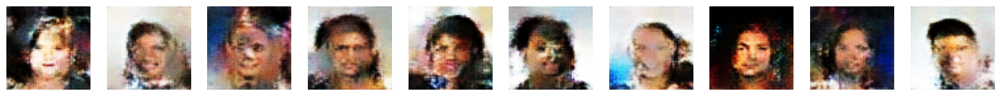


Saved to ./output/generated_img_016_label_1.png


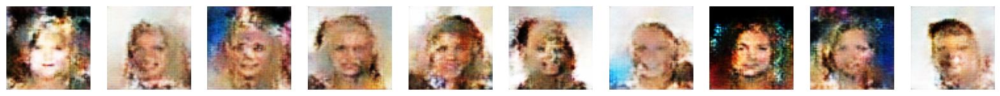

396/396 [==============================] - 126s 315ms/step - c_loss: -2.8764 - c_wass_loss: -3.1002 - c_gp: 0.0224 - g_loss: 30.9940
Epoch 18/20
396/396 [==============================] - ETA: 0s - c_loss: -2.8871 - c_wass_loss: -3.1044 - c_gp: 0.0217 - g_loss: 36.6406
Saved to ./output/generated_img_017_label_0.png


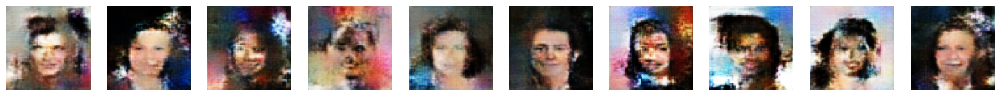


Saved to ./output/generated_img_017_label_1.png


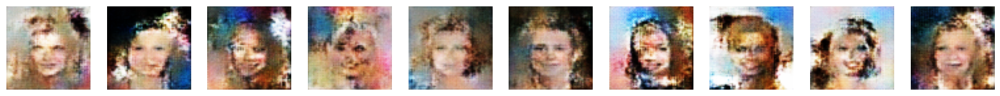

396/396 [==============================] - 127s 318ms/step - c_loss: -2.8871 - c_wass_loss: -3.1044 - c_gp: 0.0217 - g_loss: 36.6406
Epoch 19/20
396/396 [==============================] - ETA: 0s - c_loss: -2.9401 - c_wass_loss: -3.1596 - c_gp: 0.0219 - g_loss: 38.0790
Saved to ./output/generated_img_018_label_0.png


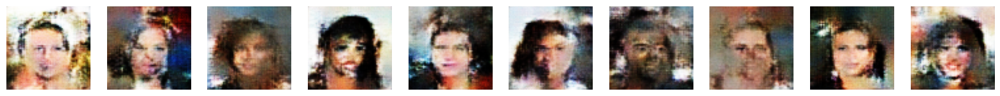


Saved to ./output/generated_img_018_label_1.png


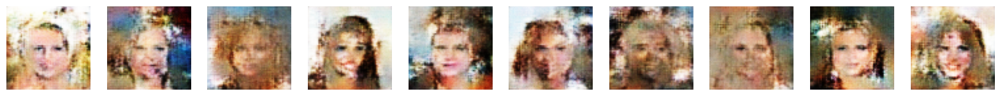

396/396 [==============================] - 129s 324ms/step - c_loss: -2.9401 - c_wass_loss: -3.1596 - c_gp: 0.0219 - g_loss: 38.0790
Epoch 20/20
396/396 [==============================] - ETA: 0s - c_loss: -2.8497 - c_wass_loss: -3.0570 - c_gp: 0.0207 - g_loss: 27.3367
Saved to ./output/generated_img_019_label_0.png


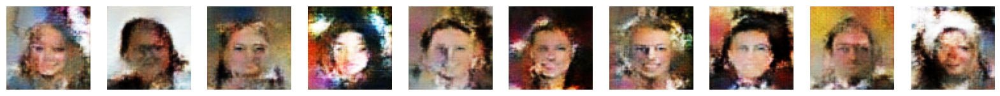


Saved to ./output/generated_img_019_label_1.png


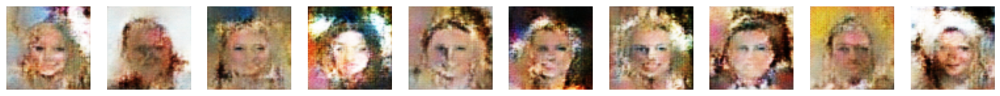

396/396 [==============================] - 127s 318ms/step - c_loss: -2.8497 - c_wass_loss: -3.0570 - c_gp: 0.0207 - g_loss: 27.3367


In [17]:
history = cgan.fit(
    train,
    epochs=EPOCHS,
    callbacks=[
        model_checkpoint_callback,
        tensorboard_callback,
        ImageGenerator(num_img=10, latent_dim=Z_DIM),
    ],
)

In [18]:
# Save the final models
generator.save("./models/generator")
critic.save("./models/critic")

INFO:tensorflow:Assets written to: ./models/generator\assets


INFO:tensorflow:Assets written to: ./models/generator\assets


INFO:tensorflow:Assets written to: ./models/critic\assets


INFO:tensorflow:Assets written to: ./models/critic\assets


## Generate images

1/1 [==============================] - 0s 193ms/step


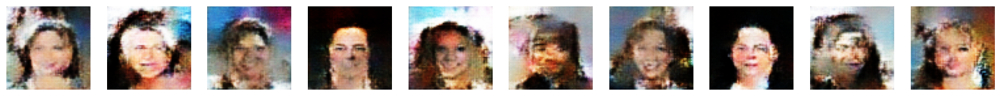

In [19]:
# 0 label
z_sample = np.random.normal(size=(10, Z_DIM))
class_label = np.repeat([[1, 0]], 10, axis=0)
imgs = cgan.generator.predict([z_sample, class_label])
display(imgs, cmap=None)

1/1 [==============================] - 0s 20ms/step


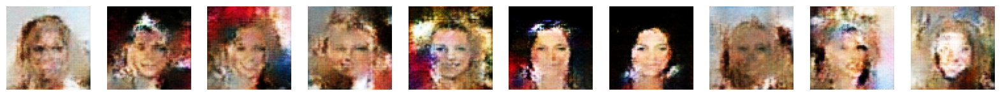

In [20]:
# 1 label
z_sample = np.random.normal(size=(10, Z_DIM))
class_label = np.repeat([[0, 1]], 10, axis=0)
imgs = cgan.generator.predict([z_sample, class_label])
display(imgs, cmap=None)